# 추가 학습(배치사이즈 4로 내려보기)

원래 배치사이즈를 늘릴 수록 일반적인 특성을 잘 학습한다고 알고있어서 16으로 늘려보려고 했으나, local GPU의 한계로 인해 batchsize를 줄여보는 학습을 진행함

In [51]:
# 필요 라이브러리 로딩
from __future__ import absolute_import, division
from __future__ import print_function, unicode_literals

import os
import time
import shutil
import functools

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['axes.grid'] = False
mpl.rcParams['figure.figsize'] = (12,12)

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import matplotlib.image as mpimg
import pandas as pd
from PIL import Image
from IPython.display import clear_output

import tensorflow as tf
import tensorflow_addons as tfa
print(tf.__version__)

from tensorflow.keras import layers
from tensorflow.keras import losses
from tensorflow.keras import models

2.13.1


## 데이터 수집 및 visualization

In [52]:
DATASET_PATH = '/home/yoojin/aiffel/exploration_node/8_MainQuest/data'

img_dir = os.path.join(DATASET_PATH, "train")
label_dir = os.path.join(DATASET_PATH, "train_labels")

In [53]:
x_train_filenames = [os.path.join(img_dir, filename) for filename in os.listdir(img_dir)]
x_train_filenames.sort()
y_train_filenames = [os.path.join(label_dir, filename) for filename in os.listdir(label_dir)]
y_train_filenames.sort()

In [54]:
x_train_filenames, x_test_filenames, y_train_filenames, y_test_filenames = \
                    train_test_split(x_train_filenames, y_train_filenames, test_size=0.2)

In [55]:
num_train_examples = len(x_train_filenames)
num_test_examples = len(x_test_filenames)

print("Number of training examples: {}".format(num_train_examples))
print("Number of test examples: {}".format(num_test_examples))

Number of training examples: 240
Number of test examples: 60


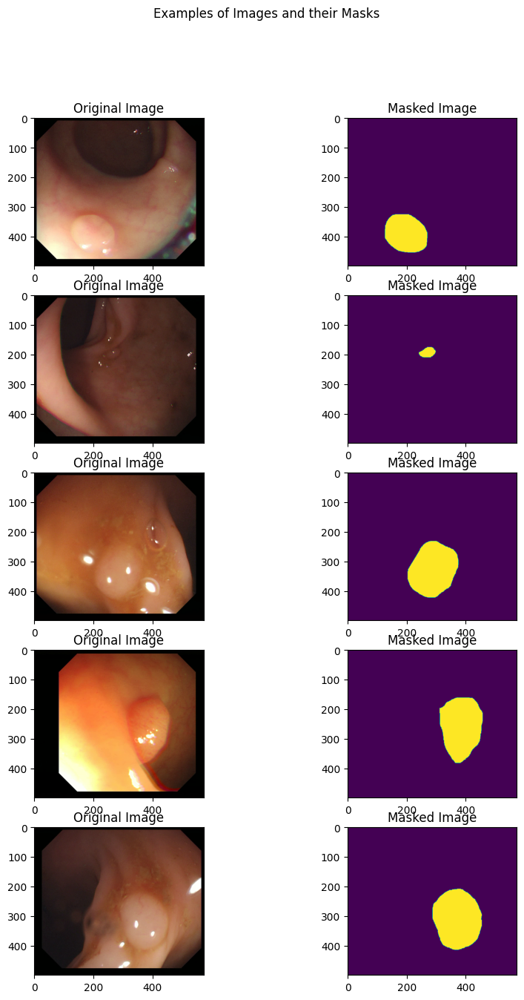

In [56]:
display_num = 5

r_choices = np.random.choice(num_train_examples, display_num)

plt.figure(figsize=(10, 15))
for i in range(0, display_num * 2, 2):
    img_num = r_choices[i // 2]
    x_pathname = x_train_filenames[img_num]
    y_pathname = y_train_filenames[img_num]

    plt.subplot(display_num, 2, i + 1)
    plt.imshow(Image.open(x_pathname))
    plt.title("Original Image")

    example_labels = Image.open(y_pathname)
    label_vals = np.unique(example_labels)

    plt.subplot(display_num, 2, i + 2)
    plt.imshow(example_labels)
    plt.title("Masked Image")
    
plt.suptitle("Examples of Images and their Masks")
plt.show()

## Data pipeline and Preprocessing

In [57]:
# Set hyperparameters

image_size = 256
img_shape = (image_size, image_size, 3)
batch_size = 4
max_epochs = 50

In [58]:
# 실제 이미지 데이터를 byte형태로 로드하고, bmp로 디코딩
# 디코딩이 완료된 image를 scale과 size를 조절
def _process_pathnames(fname, label_path):
    # We map this function onto each pathname pair
    img_str = tf.io.read_file(fname)
    img = tf.image.decode_bmp(img_str, channels=3)

    label_img_str = tf.io.read_file(label_path)
    label_img = tf.image.decode_bmp(label_img_str, channels=3)
    label_img = tf.image.rgb_to_grayscale(label_img)

    resize = [image_size, image_size]
    img = tf.image.resize(img, resize)
    label_img = tf.image.resize(label_img, resize)

    scale = 1 / 255.
    img = tf.cast(img, dtype=tf.float32) * scale
    label_img = tf.cast(label_img, dtype=tf.float32) * scale

    return img, label_img

In [59]:
# 로드한 이미지를 기반으로 이미지의 위치를 적절히 이동(shift)시키는 함수
# 입력이미지와 라벨의 쌍을 동일하게 shift
def shift_img(output_img, label_img, width_shift_range, height_shift_range):
    """This fn will perform the horizontal or vertical shift"""
    if width_shift_range or height_shift_range:
        if width_shift_range:
                width_shift_range = tf.random.uniform([],
                                                  -width_shift_range * img_shape[1],
                                                  width_shift_range * img_shape[1])
        if height_shift_range:
                height_shift_range = tf.random.uniform([],
                                                   -height_shift_range * img_shape[0],
                                                   height_shift_range * img_shape[0])
        output_img = tfa.image.translate(output_img,
                                         [width_shift_range, height_shift_range])
        label_img = tfa.image.translate(label_img,
                                        [width_shift_range, height_shift_range])
    return output_img, label_img

In [60]:
# 로드한 이미지를 기반으로 이미지를 flip
# 50%의 확률로 좌우반전만 구현하였고, 상하반전은 적용하지 않았습니다
def flip_img(horizontal_flip, tr_img, label_img):
    if horizontal_flip:
        flip_prob = tf.random.uniform([], 0.0, 1.0)
        tr_img, label_img = tf.cond(tf.less(flip_prob, 0.5),
                                lambda: (tf.image.flip_left_right(tr_img), tf.image.flip_left_right(label_img)),
                                lambda: (tr_img, label_img))
    return tr_img, label_img

In [61]:
# 위에서 구현한 Augmentation용 함수를 이용해 Data augmentation에 사용하는 _augment() 함수를 구성합니다. 
# 위에서 적용한 것들 이외에도 resize, hue_delta가 적용됨
def _augment(img,
             label_img,
             resize=None,  # Resize the image to some size e.g. [256, 256]
             scale=1,  # Scale image e.g. 1 / 255.
             hue_delta=0.,  # Adjust the hue of an RGB image by random factor
             horizontal_flip=True,  # Random left right flip,
             width_shift_range=0.05,  # Randomly translate the image horizontally
             height_shift_range=0.05):  # Randomly translate the image vertically 
    if resize is not None:
        # Resize both images
        label_img = tf.image.resize(label_img, resize)
        img = tf.image.resize(img, resize)
  
    if hue_delta:
        img = tf.image.random_hue(img, hue_delta)
  
    img, label_img = flip_img(horizontal_flip, img, label_img)
    img, label_img = shift_img(img, label_img, width_shift_range, height_shift_range)
    label_img = tf.cast(label_img, dtype=tf.float32) * scale
    img = tf.cast(img, dtype=tf.float32) * scale
    return img, label_img

In [62]:
#  tf.data.Dataset을 이용하여 데이터셋 배치구성, 셔플링 등을 구현
def get_baseline_dataset(filenames,
                         labels,
                         preproc_fn=functools.partial(_augment),
                         threads=4,
                         batch_size=batch_size,
                         is_train=True):
    num_x = len(filenames)
    # Create a dataset from the filenames and labels
    dataset = tf.data.Dataset.from_tensor_slices((filenames, labels))
    # Map our preprocessing function to every element in our dataset, taking
    # advantage of multithreading
    dataset = dataset.map(_process_pathnames, num_parallel_calls=threads)

    if is_train:# 학습을 진행할시에만 위에 augment를 진행합니다.
        #if preproc_fn.keywords is not None and 'resize' not in preproc_fn.keywords:
        #  assert batch_size == 1, "Batching images must be of the same size"
        dataset = dataset.map(preproc_fn, num_parallel_calls=threads)
        dataset = dataset.shuffle(num_x * 10)

    dataset = dataset.batch(batch_size)
    return dataset

In [63]:
train_dataset = get_baseline_dataset(x_train_filenames, # 학습 데이터
                                     y_train_filenames) # 정답 데이터
train_dataset = train_dataset.repeat()
test_dataset = get_baseline_dataset(x_test_filenames,
                                    y_test_filenames,
                                    is_train=False)
train_dataset

<_RepeatDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 256, 256, 1), dtype=tf.float32, name=None))>

## 모델 build

## 모델 선택하기 1 : encoder-decoder

In [74]:
# inputs: [batch_size, 256, 256, 3]
encoder = tf.keras.Sequential(name='encoder')

# conv-batchnorm-activation-maxpool
encoder.add(layers.Conv2D(64, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(64, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv1: [batch_size, 128, 128, 64]

encoder.add(layers.Conv2D(128, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(128, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv2: [batch_size, 64, 64, 128]

encoder.add(layers.Conv2D(256, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(256, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv3: [batch_size, 32, 32, 256]

encoder.add(layers.Conv2D(512, (3, 3), padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu'))
encoder.add(layers.Conv2D(512, (3, 3), strides=2, padding='same'))
encoder.add(layers.BatchNormalization())
encoder.add(layers.Activation('relu')) # conv4-outputs: [batch_size, 16, 16, 512]

In [75]:
# Encoder 제대로 만들어졌는지 확인

bottleneck = encoder(tf.random.normal([batch_size, 256, 256, 3]))
print(bottleneck.shape)   # (batch_size, 16, 16, 512) 이 나오는지 확인

(8, 16, 16, 512)


In [76]:
# inputs: [batch_size, 16, 16, 512]
decoder = tf.keras.Sequential(name='decoder')

# conv_transpose-batchnorm-activation
decoder.add(layers.Conv2DTranspose(256, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv_transpose1: [batch_size, 32, 32, 256]
decoder.add(layers.Conv2D(256, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(128, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv_transpose2: [batch_size, 64, 64, 128]
decoder.add(layers.Conv2D(128, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(64, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv_transpose3: [batch_size, 128, 128, 64]
decoder.add(layers.Conv2D(64, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(32, (3, 3), strides=2, padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu')) # conv transpose4-outputs: [batch_size, 256, 256, 32]
decoder.add(layers.Conv2D(32, (3, 3), padding='same'))
decoder.add(layers.BatchNormalization())
decoder.add(layers.Activation('relu'))

decoder.add(layers.Conv2DTranspose(1, 1, strides=1, padding='same', activation='sigmoid'))

In [77]:
# decoder 제대로 만들어졌는지 확인

predictions = decoder(bottleneck)
print(predictions.shape)    # (batch_size, 256, 256, 1) 이 나오는지 확인

(8, 256, 256, 1)


In [78]:
# 인코더와 디코더 모델 합치기
ed_model = tf.keras.Sequential()

ed_model.add(encoder)
ed_model.add(decoder)

In [79]:
print('select the Encoder-Decoder model')
model = ed_model

select the Encoder-Decoder model


### Metric, loss function 정의하기

In [80]:
def dice_coeff(y_true, y_pred):
    smooth = 1e-10
    # Flatten the tensors
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    # Compute intersection and dice coefficient
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(tf.square(y_true_f)) + \
                                            tf.reduce_sum(tf.square(y_pred_f)) + smooth)
    return score

In [81]:
# dice loss가 최대화 되는 방향으로 구해지도록 설정
def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

In [82]:
# binary crossentropy loss와 dice loss를 더하기
def bce_dice_loss(y_true, y_pred):
    loss = tf.reduce_mean(losses.binary_crossentropy(y_true, y_pred)) + dice_loss(y_true, y_pred)
    return loss

In [83]:
optimizer = tf.keras.optimizers.Adam() # 기본 Learning rate 사용

In [84]:
model.compile(optimizer=optimizer, loss=bce_dice_loss, metrics=[dice_loss])
predictions = model(tf.random.normal([batch_size, image_size, image_size, 3]))
print(predictions.shape)

(8, 256, 256, 1)


In [85]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder (Sequential)        (8, 16, 16, 512)          4693056   
                                                                 
 decoder (Sequential)        (8, 256, 256, 1)          2354913   
                                                                 
Total params: 7047969 (26.89 MB)
Trainable params: 7042209 (26.86 MB)
Non-trainable params: 5760 (22.50 KB)
_________________________________________________________________


### callback 설정

In [86]:
checkpoint_dir =os.path.join(DATASET_PATH,'train_ckpt/ed_model2')

if not os.path.isdir(checkpoint_dir):
    os.makedirs(checkpoint_dir)

cp_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_dir,
                                                 save_weights_only=True,
                                                 monitor='val_loss',
                                                 mode='auto',
                                                 save_best_only=True,
                                                 verbose=0)

In [87]:
cos_decay = tf.keras.experimental.CosineDecay(1e-3, 
                                              max_epochs)
lr_callback = tf.keras.callbacks.LearningRateScheduler(cos_decay, verbose=1)

### 모델 훈련

In [88]:
history = model.fit(train_dataset,
                    epochs=max_epochs,    # 50
                    steps_per_epoch=num_train_examples//batch_size,
                    validation_data=test_dataset,
                    validation_steps=num_test_examples//batch_size,
                    callbacks=[cp_callback, lr_callback]
                    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/50
30/30 [==============================] - 13s 136ms/step - loss: 1.3724 - dice_loss: 0.8113 - val_loss: 3.3457 - val_dice_loss: 0.9442 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.000999013427644968.
Epoch 2/50
30/30 [==============================] - 5s 159ms/step - loss: 1.1058 - dice_loss: 0.7759 - val_loss: 1.0982 - val_dice_loss: 0.8183 - lr: 9.9901e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0009960574097931385.
Epoch 3/50
30/30 [==============================] - 4s 120ms/step - loss: 1.0163 - dice_loss: 0.7322 - val_loss: 1.6419 - val_dice_loss: 0.8639 - lr: 9.9606e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0009911436354741454.
Epoch 4/50
30/30 [==============================] - 5s 155ms/step - loss: 0.9771 - dice_loss: 0.7201 - val_loss: 1.0593 - val_dice_loss: 0.7363 - lr: 9.9114e-04

Epoch 5: LearningRateScheduler setting 

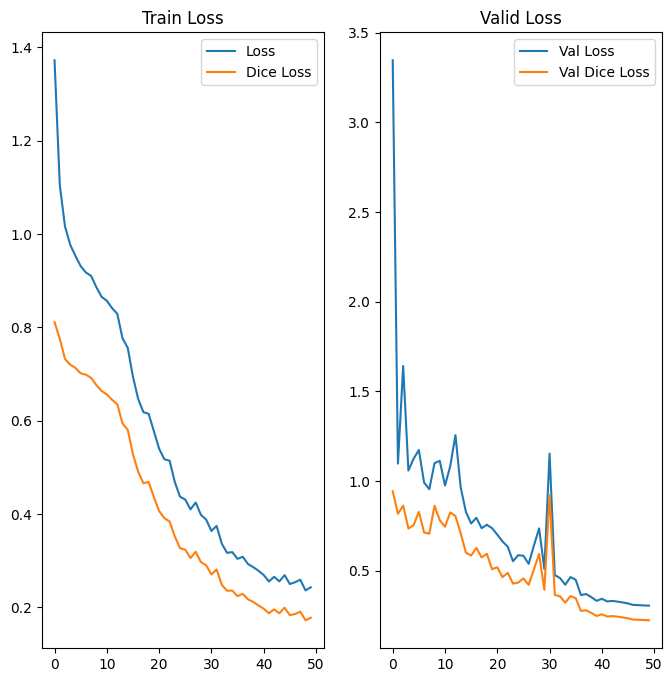

In [89]:
# 저장된 학습 진행과정(history)을 시각화
h_dice_loss = history.history['dice_loss']
h_loss = history.history['loss']
val_dice_loss = history.history['val_dice_loss']
val_loss = history.history['val_loss']

epochs_range = range(max_epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, h_loss, label='Loss')
plt.plot(epochs_range, h_dice_loss, label='Dice Loss')
plt.legend(loc='upper right')
plt.title('Train Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label='Val Loss')
plt.plot(epochs_range, val_dice_loss, label='Val Dice Loss')
plt.legend(loc='upper right')
plt.title('Valid Loss')
plt.show()

### 모델 평가

In [91]:
def mean_iou(y_true, y_pred, num_classes=2):
    # Flatten  
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])

    y_true_f = tf.cast(tf.round(y_true_f), dtype=tf.int32).numpy()
    y_pred_f = tf.cast(tf.round(y_pred_f), dtype=tf.int32).numpy()

    # calculate confusion matrix
    labels = list(range(num_classes))
    current = confusion_matrix(y_true_f, y_pred_f, labels=labels)

    # compute mean iou
    intersection = np.diag(current)
    ground_truth_set = current.sum(axis=1)
    predicted_set = current.sum(axis=0)
    union = ground_truth_set + predicted_set - intersection

    IoU = intersection / union.astype(np.float32)
    return np.mean(IoU)

In [92]:
# 테스트 데이터셋으로 meanIoU값 구하기
mean = []

for images, labels in test_dataset:
    predictions = model(images, training=False)
    m = mean_iou(labels, predictions)
    mean.append(m)

mean = np.array(mean)
mean = np.mean(mean)
print("mean_iou: {}".format(mean))

mean_iou: 0.7916630810571875


In [93]:
## Define print function
def print_images():
    import matplotlib.pyplot as plt

    # 5개의 이미지를 가져와서 출력
    for batch_index, (test_images, test_labels) in enumerate(test_dataset.take(5)):
        predictions = model(test_images, training=False)

        # 각 배치에서 하나의 이미지와 그에 해당하는 마스크 출력
        for i in range(test_images.shape[0]):
            plt.figure(figsize=(10, 5))

            plt.subplot(1, 3, 1)
            plt.imshow(test_images[i, :, :, :])
            plt.title("Input image")
            
            plt.subplot(1, 3, 2)
            plt.imshow(test_labels[i, :, :, 0])
            plt.title("Actual Mask")
            
            plt.subplot(1, 3, 3)
            plt.imshow(predictions[i, :, :, 0])
            plt.title("Predicted Mask")

            plt.show()

        # 5개의 배치만 처리 후 종료
        if batch_index == 4:
            break

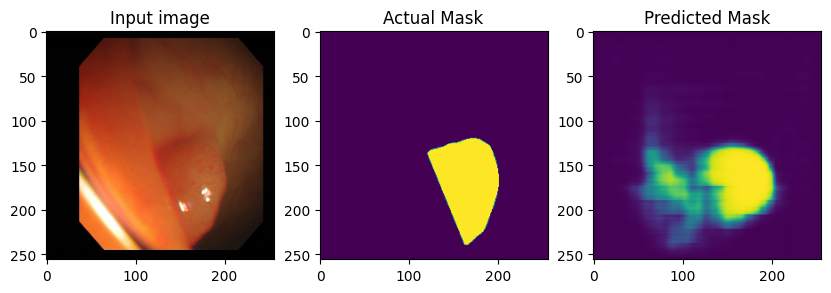

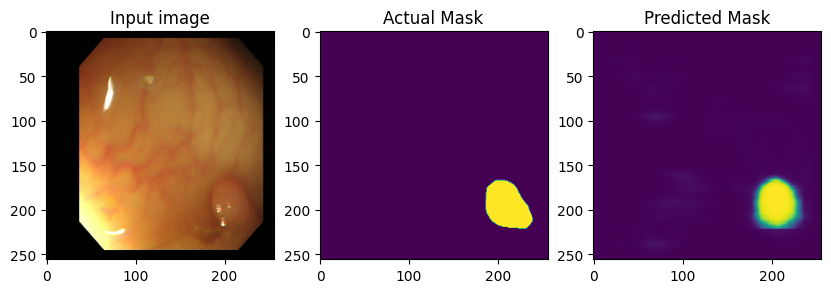

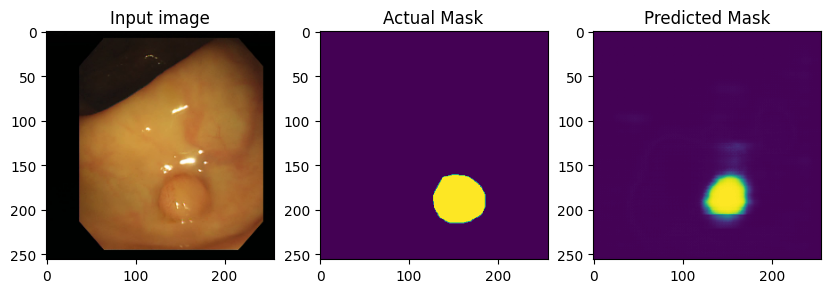

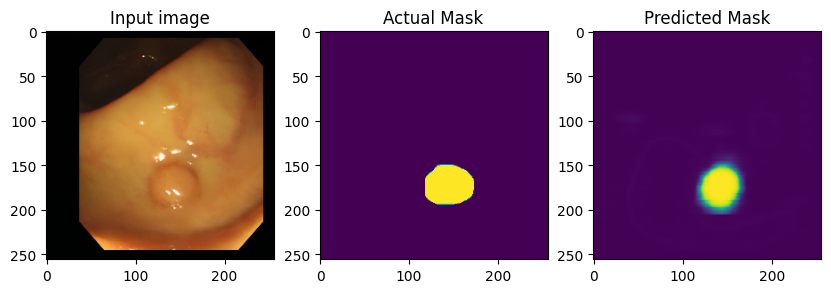

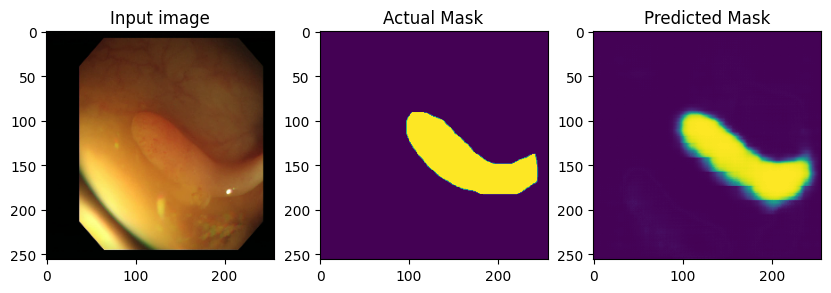

...

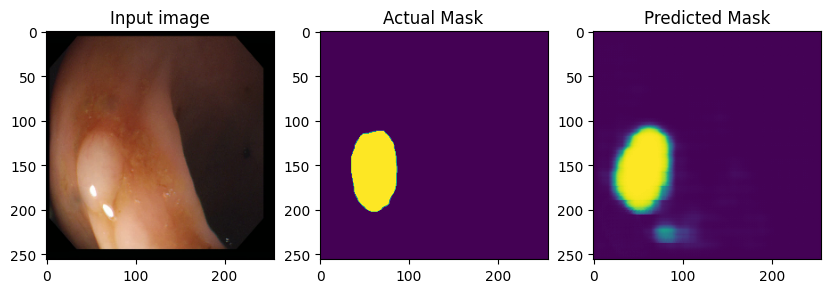

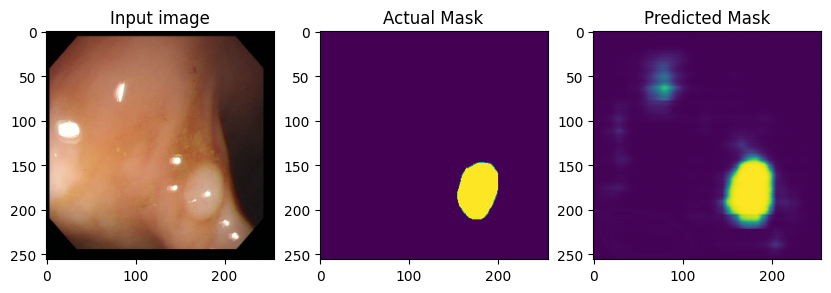

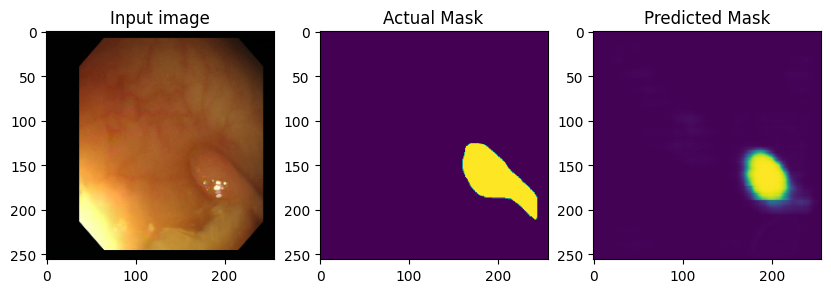

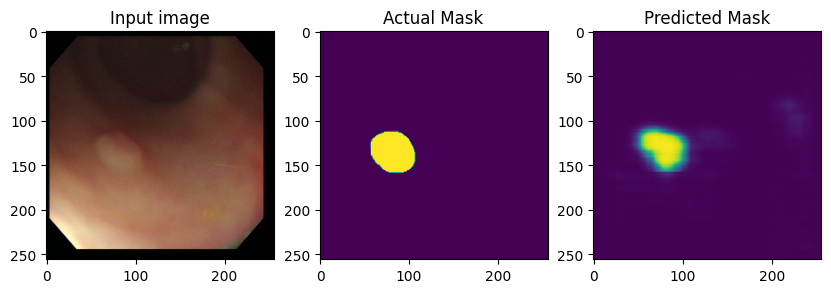

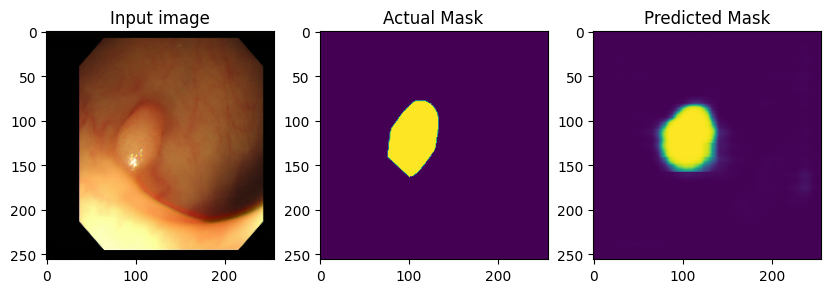

In [94]:
print_images()

## 모델 : U-net

**Model subclassing을 활용한 구현**  
U-Net은 Encoder-Decoder 구조와는 달리 해당 레이어의 outputs이 바로 다음 레이어의 inputs이 되지 않습니다. 이럴때는 위에 Encoder-Decoder 모델처럼 tf.keras.Sequential()을 쓸 수가 없게 됩니다.

Sequential 구조가 아닌 네트워크를 만들 때 쓸 수 있는 API 가 바로 tf.keras functional API 입니다. 오늘 우리는 U-Net 구현을 위해 Model subclassing 방식을 사용하여, tf.keras.Model 클래스를 상속하여 구현할 것입니다.

In [81]:
class Conv(tf.keras.Model):
    def __init__(self, num_filters, kernel_size):
        super(Conv, self).__init__()
        self.conv = layers.Conv2D(num_filters, kernel_size, padding='same')
        self.bn = layers.BatchNormalization()

    def call(self, inputs, training=True):
        x = self.conv(inputs)
        x = self.bn(x, training=training)
        x = layers.ReLU()(x)

        return x

In [82]:
class ConvBlock(tf.keras.Model):
    def __init__(self, num_filters):
        super(ConvBlock, self).__init__()
        self.conv1 = Conv(num_filters, 3)
        self.conv2 = Conv(num_filters * 2, 3)

    def call(self, inputs, training=True):
        encoder = self.conv1(inputs, training=training)
        encoder = self.conv2(encoder, training=training)

        return encoder

class ConvBlock_R(tf.keras.Model):
    def __init__(self, num_filters):
        super(ConvBlock_R, self).__init__()
        self.conv1 = Conv(num_filters, 3)
        self.conv2 = Conv(num_filters, 3)

    def call(self, inputs, training=True):
        decoder = self.conv1(inputs, training=training)
        decoder = self.conv2(decoder, training=training)

        return decoder


class EncoderBlock(tf.keras.Model):
    def __init__(self, num_filters):
        super(EncoderBlock, self).__init__()
        self.conv_block = ConvBlock(num_filters)
        self.encoder_pool = layers.MaxPool2D()

    def call(self, inputs, training=True):
        encoder = self.conv_block(inputs, training=training)
        encoder_pool = self.encoder_pool(encoder)

        return encoder_pool, encoder


class DecoderBlock(tf.keras.Model):
    def __init__(self, num_filters):
        super(DecoderBlock, self).__init__()
        self.convT = layers.Conv2DTranspose(num_filters, 3, strides=2, padding='same')
        self.bn = layers.BatchNormalization()
        self.conv_block_r = ConvBlock_R(num_filters)

    def call(self, input_tensor, concat_tensor, training=True):
        decoder = self.convT(input_tensor)            
        decoder = self.bn(decoder, training=training)
        decoder = layers.ReLU()(decoder)
        decoder = tf.concat([decoder, concat_tensor], axis=-1)
        decoder = self.conv_block_r(decoder, training=training)

        return decoder

In [83]:
class UNet(tf.keras.Model):
    def __init__(self):
        super(UNet, self).__init__()
        self.encoder_block1 = EncoderBlock(64)
        self.encoder_block2 = EncoderBlock(128)
        self.encoder_block3 = EncoderBlock(256)
        self.encoder_block4 = EncoderBlock(512)

        self.center = ConvBlock(1024)

        self.decoder_block4 = DecoderBlock(512)
        self.decoder_block3 = DecoderBlock(256)
        self.decoder_block2 = DecoderBlock(128)
        self.decoder_block1 = DecoderBlock(64)

        self.output_conv = layers.Conv2D(1, 1, activation='sigmoid')

    def call(self, inputs, training=True):
        encoder1_pool, encoder1 = self.encoder_block1(inputs)
        encoder2_pool, encoder2 = self.encoder_block2(encoder1_pool)
        encoder3_pool, encoder3 = self.encoder_block3(encoder2_pool)
        encoder4_pool, encoder4 = self.encoder_block4(encoder3_pool)

        center = self.center(encoder4_pool)

        decoder4 = self.decoder_block4(center, encoder4)
        decoder3 = self.decoder_block3(decoder4, encoder3)
        decoder2 = self.decoder_block2(decoder3, encoder2)
        decoder1 = self.decoder_block1(decoder2, encoder1)

        outputs = self.output_conv(decoder1)

        return outputs

In [94]:
# UNet 모델 구현
unet_model = UNet()
model = unet_model

In [95]:
def dice_coeff(y_true, y_pred):
    smooth = 1e-10
    # Flatten the tensors
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    # Compute intersection and dice coefficient
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (tf.reduce_sum(tf.square(y_true_f)) + \
                                            tf.reduce_sum(tf.square(y_pred_f)) + smooth)
    return score

In [96]:
# dice loss가 최대화 되는 방향으로 구해지도록 설정
def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss

In [97]:
# binary crossentropy loss와 dice loss를 더하기
def bce_dice_loss(y_true, y_pred):
    loss = tf.reduce_mean(losses.binary_crossentropy(y_true, y_pred)) + dice_loss(y_true, y_pred)
    return loss

In [98]:
optimizer = tf.keras.optimizers.Adam() # 기본 Learning rate 사용

In [99]:
model.compile(optimizer=optimizer, loss=bce_dice_loss, metrics=[dice_loss])
predictions = model(tf.random.normal([batch_size, image_size, image_size, 3]))
print(predictions.shape)

(4, 256, 256, 1)


In [100]:
model.summary()

Model: "u_net_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_block_16 (EncoderB  multiple                  76416     
 lock)                                                           
                                                                 
 encoder_block_17 (EncoderB  multiple                  444288    
 lock)                                                           
                                                                 
 encoder_block_18 (EncoderB  multiple                  1773312   
 lock)                                                           
                                                                 
 encoder_block_19 (EncoderB  multiple                  7085568   
 lock)                                                           
                                                                 
 conv_block_25 (ConvBlock)   multiple                  2832

### callback 설정

In [101]:
if not os.path.isdir(checkpoint_dir):
    os.makedirs(checkpoint_dir)

cp_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_dir,
                                                 save_weights_only=True,
                                                 monitor='val_loss',
                                                 mode='auto',
                                                 save_best_only=True,
                                                 verbose=0)

In [102]:
cos_decay = tf.keras.experimental.CosineDecay(1e-3, 
                                              max_epochs)
lr_callback = tf.keras.callbacks.LearningRateScheduler(cos_decay, verbose=1)

### 모델 훈련

In [103]:
history = model.fit(train_dataset,
                    epochs=max_epochs,    # 50
                    steps_per_epoch=num_train_examples//batch_size,
                    validation_data=test_dataset,
                    validation_steps=num_test_examples//batch_size,
                    callbacks=[cp_callback, lr_callback]
                    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/50
60/60 [==============================] - 32s 394ms/step - loss: 0.9974 - dice_loss: 0.7298 - val_loss: 449.6285 - val_dice_loss: 1.0000 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.000999013427644968.
Epoch 2/50
60/60 [==============================] - 24s 394ms/step - loss: 0.9228 - dice_loss: 0.7113 - val_loss: 23.5440 - val_dice_loss: 0.8638 - lr: 9.9901e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0009960574097931385.
Epoch 3/50
60/60 [==============================] - 23s 380ms/step - loss: 0.9214 - dice_loss: 0.7156 - val_loss: 1.0133 - val_dice_loss: 0.8224 - lr: 9.9606e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0009911436354741454.
Epoch 4/50
60/60 [==============================] - 23s 393ms/step - loss: 0.9117 - dice_loss: 0.7096 - val_loss: 0.9588 - val_dice_loss: 0.7694 - lr: 9.9114e-04

Epoch 5: LearningRateScheduler se

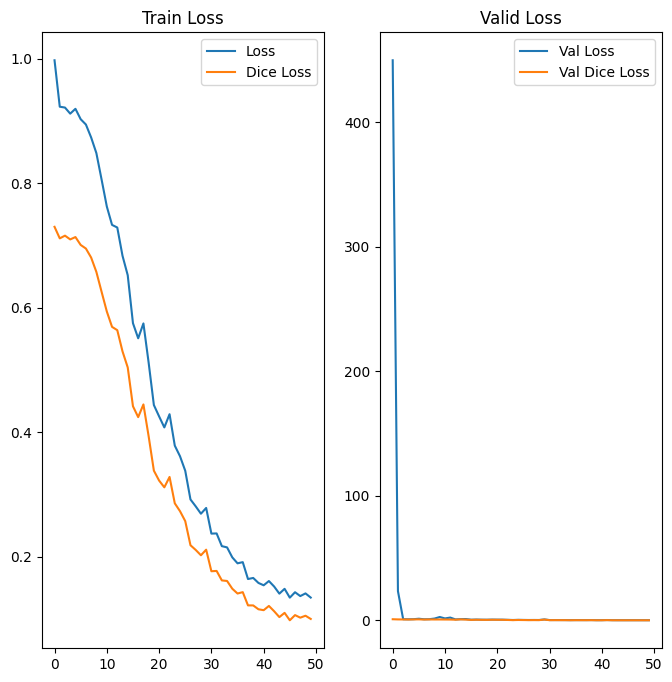

In [104]:
# 저장된 학습 진행과정(history)을 시각화
h_dice_loss = history.history['dice_loss']
h_loss = history.history['loss']
val_dice_loss = history.history['val_dice_loss']
val_loss = history.history['val_loss']

epochs_range = range(max_epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, h_loss, label='Loss')
plt.plot(epochs_range, h_dice_loss, label='Dice Loss')
plt.legend(loc='upper right')
plt.title('Train Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label='Val Loss')
plt.plot(epochs_range, val_dice_loss, label='Val Dice Loss')
plt.legend(loc='upper right')
plt.title('Valid Loss')
plt.show()

### 모델 평가

In [105]:
def mean_iou(y_true, y_pred, num_classes=2):
    # Flatten  
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])

    y_true_f = tf.cast(tf.round(y_true_f), dtype=tf.int32).numpy()
    y_pred_f = tf.cast(tf.round(y_pred_f), dtype=tf.int32).numpy()

    # calculate confusion matrix
    labels = list(range(num_classes))
    current = confusion_matrix(y_true_f, y_pred_f, labels=labels)

    # compute mean iou
    intersection = np.diag(current)
    ground_truth_set = current.sum(axis=1)
    predicted_set = current.sum(axis=0)
    union = ground_truth_set + predicted_set - intersection

    IoU = intersection / union.astype(np.float32)
    return np.mean(IoU)

In [106]:
# 테스트 데이터셋으로 meanIoU값 구하기
mean = []

for images, labels in test_dataset:
    predictions = model(images, training=False)
    m = mean_iou(labels, predictions)
    mean.append(m)

mean = np.array(mean)
mean = np.mean(mean)
print("mean_iou: {}".format(mean))

mean_iou: 0.8354637450693675


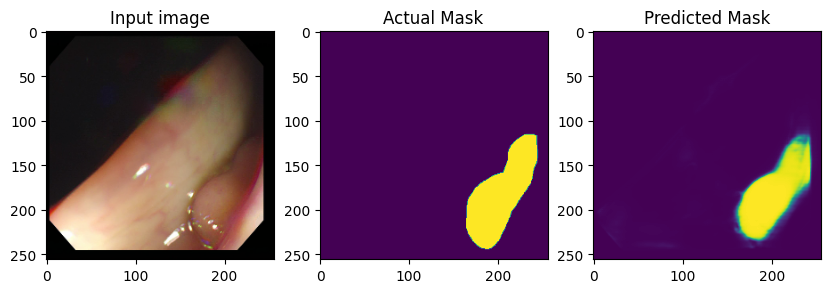

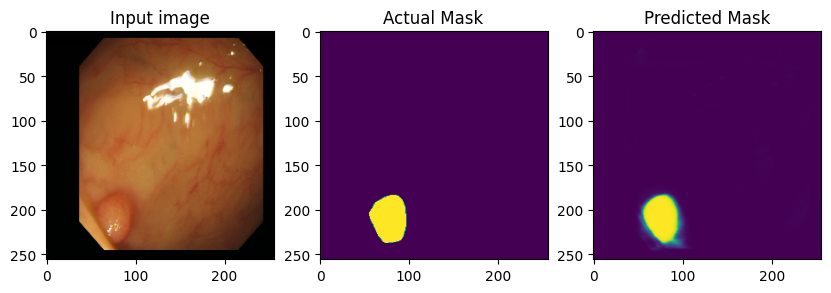

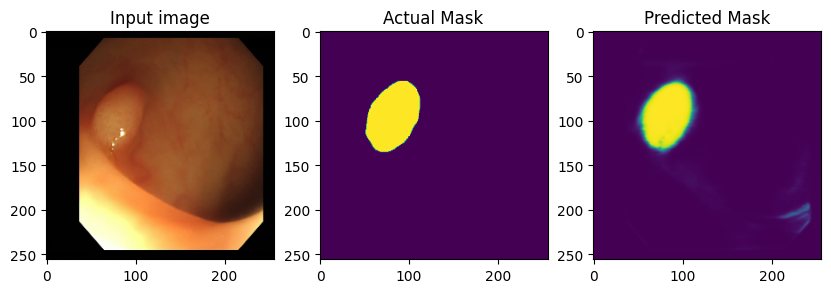

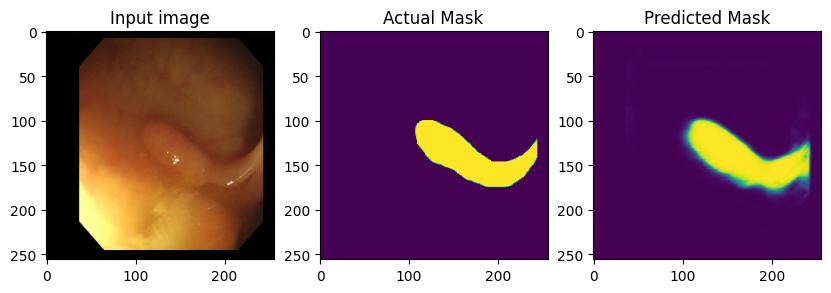

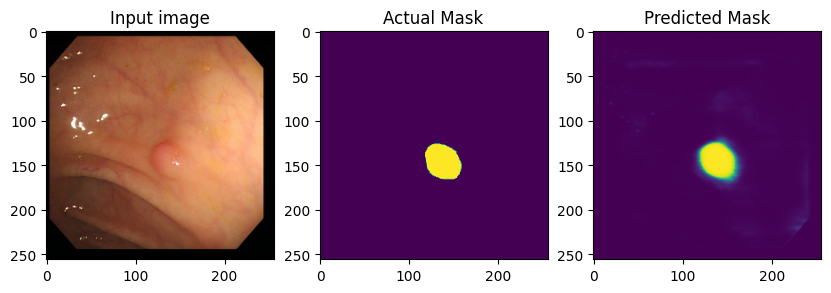

...

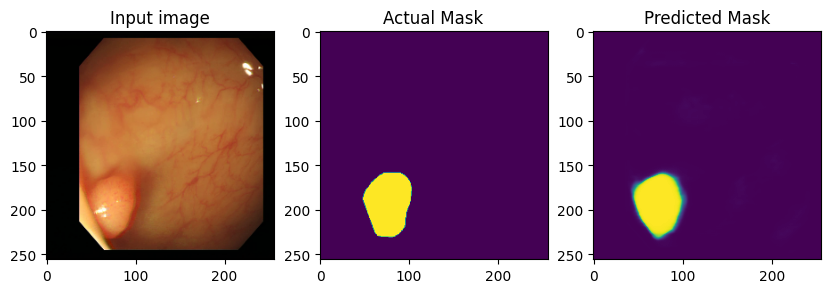

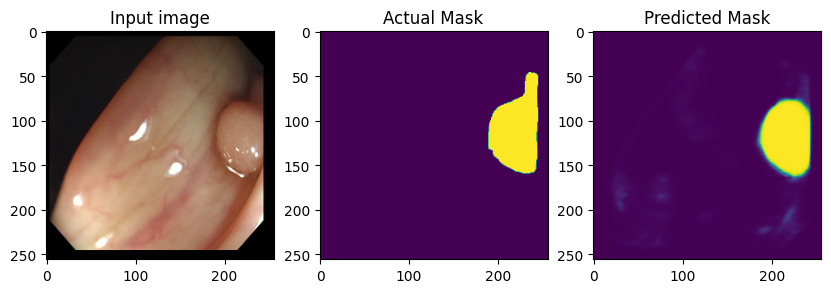

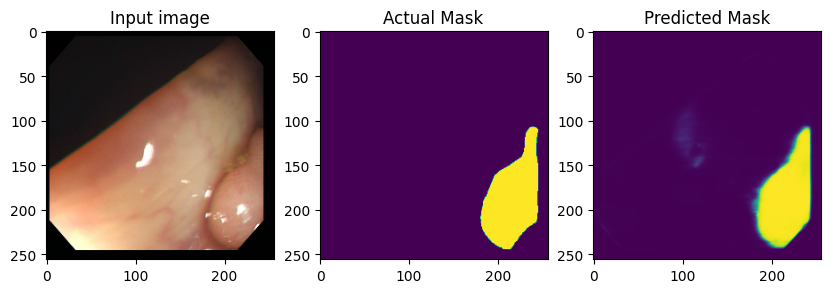

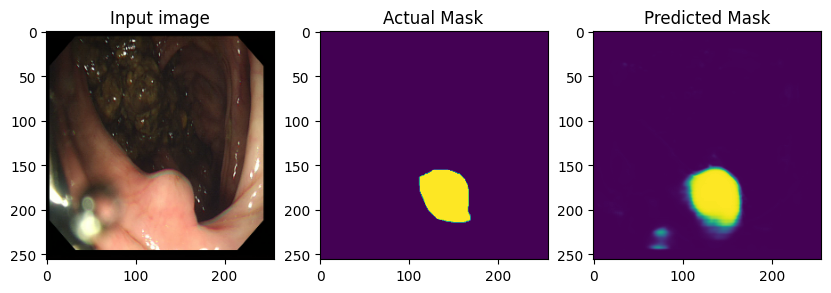

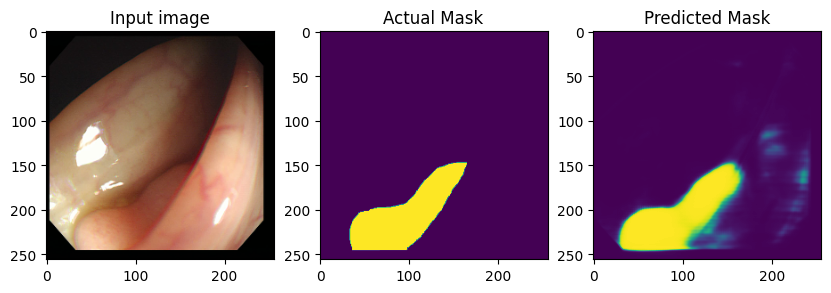

In [107]:
## Define print function
def print_images():
    import matplotlib.pyplot as plt

    # 5개의 이미지를 가져와서 출력
    for batch_index, (test_images, test_labels) in enumerate(test_dataset.take(5)):
        predictions = model(test_images, training=False)

        # 각 배치에서 하나의 이미지와 그에 해당하는 마스크 출력
        for i in range(test_images.shape[0]):
            plt.figure(figsize=(10, 5))

            plt.subplot(1, 3, 1)
            plt.imshow(test_images[i, :, :, :])
            plt.title("Input image")
            
            plt.subplot(1, 3, 2)
            plt.imshow(test_labels[i, :, :, 0])
            plt.title("Actual Mask")
            
            plt.subplot(1, 3, 3)
            plt.imshow(predictions[i, :, :, 0])
            plt.title("Predicted Mask")

            plt.show()

        # 5개의 배치만 처리 후 종료
        if batch_index == 4:
            break

print_images()

## U-net 성능 개선해보기 : VGG16UNet

In [ ]:
# vgg16 레이어 구성 확인
vgg16 = tf.keras.applications.VGG16(input_shape=img_shape,
                                         include_top=False,
                                         weights='imagenet')
layer_outputs = [layer.output for layer in vgg16.layers]
layer_outputs

In [109]:
class Vgg16UNet(tf.keras.Model):
    def __init__(self):
        super(Vgg16UNet, self).__init__()
        self.vgg16 = tf.keras.applications.VGG16(input_shape=img_shape,
                                         include_top=False,
                                         weights='imagenet')
        layer_outputs = [layer.output for layer in self.vgg16.layers]
        self.vgg16_act = models.Model(inputs=self.vgg16.input, 
                                      outputs=[layer_outputs[2], 
                                               layer_outputs[5], 
                                               layer_outputs[9], 
                                               layer_outputs[13], 
                                               layer_outputs[17]])


        self.center = ConvBlock(1024)

        self.decoder_block4 = DecoderBlock(512)
        self.decoder_block3 = DecoderBlock(256)
        self.decoder_block2 = DecoderBlock(128)
        self.decoder_block1 = DecoderBlock(64)

        self.output_conv = layers.Conv2D(1, 1, activation='sigmoid')

    def call(self, inputs, training=True):

        encoder1, encoder2, encoder3, encoder4, center = self.vgg16_act(inputs) 

        decoder4 = self.decoder_block4(center, encoder4)
        decoder3 = self.decoder_block3(decoder4, encoder3)
        decoder2 = self.decoder_block2(decoder3, encoder2)
        decoder1 = self.decoder_block1(decoder2, encoder1)
        
        outputs = self.output_conv(decoder1)

        return outputs

In [111]:
# UNet 모델 구현
model = Vgg16UNet()

In [112]:
optimizer = tf.keras.optimizers.Adam() # 기본 Learning rate 사용

In [113]:
model.compile(optimizer=optimizer, loss=bce_dice_loss, metrics=[dice_loss])
predictions = model(tf.random.normal([batch_size, image_size, image_size, 3]))
print(predictions.shape)

(4, 256, 256, 1)


In [114]:
model.summary()

Model: "vgg16u_net_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 model_3 (Functional)        [(None, 256, 256, 64),    14714688  
                              (None, 128, 128, 128),             
                              (None, 64, 64, 256),               
                              (None, 32, 32, 512),               
                              (None, 16, 16, 512)]               
                                                                 
 conv_block_27 (ConvBlock)   multiple                  0 (unused)
                                                                 
 decoder_block_28 (DecoderB  multiple                  9444864   
 lock)                                                           
                                                      

### callback 설정

In [115]:
if not os.path.isdir(checkpoint_dir):
    os.makedirs(checkpoint_dir)

cp_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_dir,
                                                 save_weights_only=True,
                                                 monitor='val_loss',
                                                 mode='auto',
                                                 save_best_only=True,
                                                 verbose=0)

In [116]:
cos_decay = tf.keras.experimental.CosineDecay(1e-3, 
                                              max_epochs)
lr_callback = tf.keras.callbacks.LearningRateScheduler(cos_decay, verbose=1)

### 모델 훈련

In [117]:
history = model.fit(train_dataset,
                    epochs=max_epochs,    # 50
                    steps_per_epoch=num_train_examples//batch_size,
                    validation_data=test_dataset,
                    validation_steps=num_test_examples//batch_size,
                    callbacks=[cp_callback, lr_callback]
                    )


Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/50
60/60 [==============================] - 19s 165ms/step - loss: 0.9445 - dice_loss: 0.6914 - val_loss: 7.6580 - val_dice_loss: 1.0000 - lr: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.000999013427644968.
Epoch 2/50
60/60 [==============================] - 15s 251ms/step - loss: 0.7800 - dice_loss: 0.5970 - val_loss: 1.0614 - val_dice_loss: 0.8414 - lr: 9.9901e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0009960574097931385.
Epoch 3/50
60/60 [==============================] - 13s 213ms/step - loss: 0.7363 - dice_loss: 0.5653 - val_loss: 1.0194 - val_dice_loss: 0.8059 - lr: 9.9606e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0009911436354741454.
Epoch 4/50
60/60 [==============================] - 13s 225ms/step - loss: 0.6934 - dice_loss: 0.5337 - val_loss: 0.9834 - val_dice_loss: 0.7862 - lr: 9.9114e-04

Epoch 5: LearningRateScheduler setti

In [ ]:
# 저장된 학습 진행과정(history)을 시각화
h_dice_loss = history.history['dice_loss']
h_loss = history.history['loss']
val_dice_loss = history.history['val_dice_loss']
val_loss = history.history['val_loss']

epochs_range = range(max_epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, h_loss, label='Loss')
plt.plot(epochs_range, h_dice_loss, label='Dice Loss')
plt.legend(loc='upper right')
plt.title('Train Loss')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, val_loss, label='Val Loss')
plt.plot(epochs_range, val_dice_loss, label='Val Dice Loss')
plt.legend(loc='upper right')
plt.title('Valid Loss')
plt.show()

### 모델 평가

In [118]:
# 테스트 데이터셋으로 meanIoU값 구하기
mean = []

for images, labels in test_dataset:
    predictions = model(images, training=False)
    m = mean_iou(labels, predictions)
    mean.append(m)

mean = np.array(mean)
mean = np.mean(mean)
print("mean_iou: {}".format(mean))

mean_iou: 0.8496284703266106


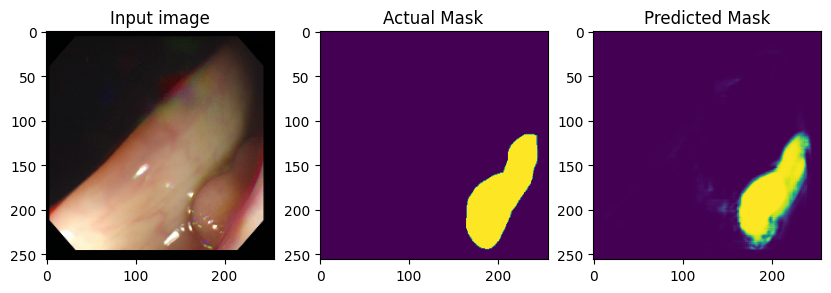

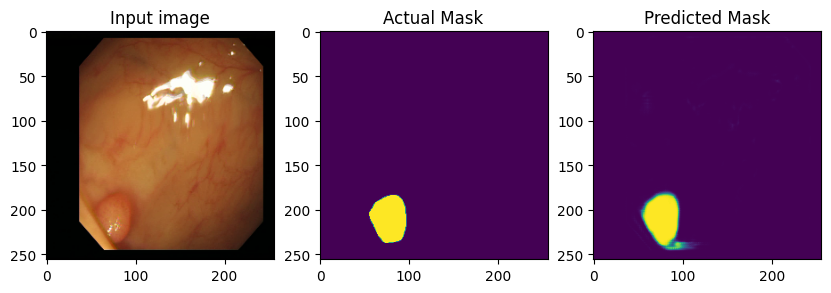

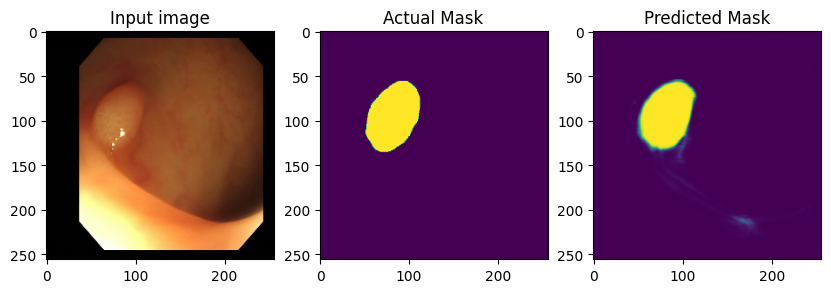

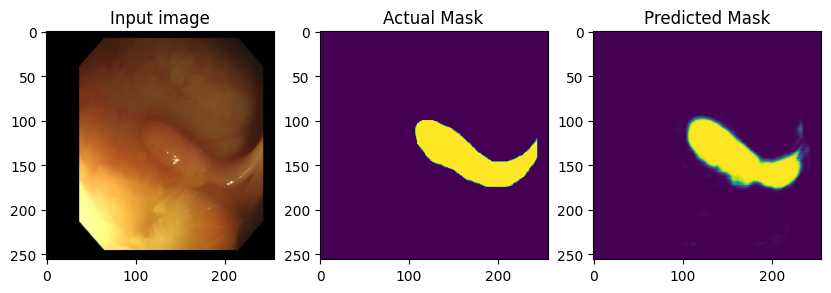

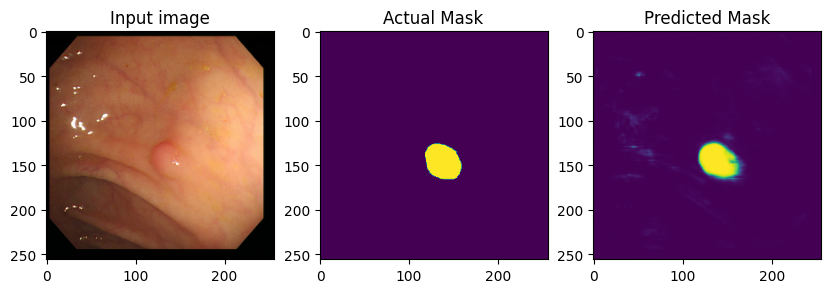

...

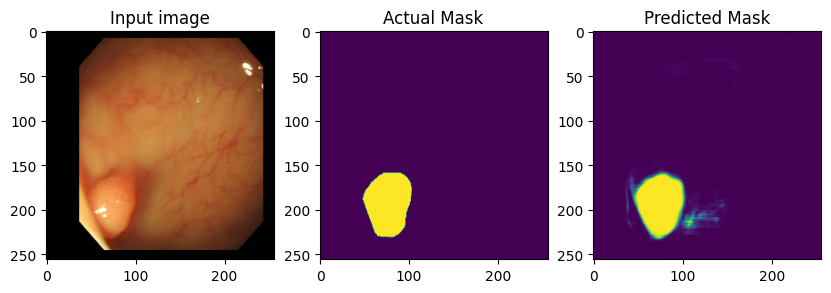

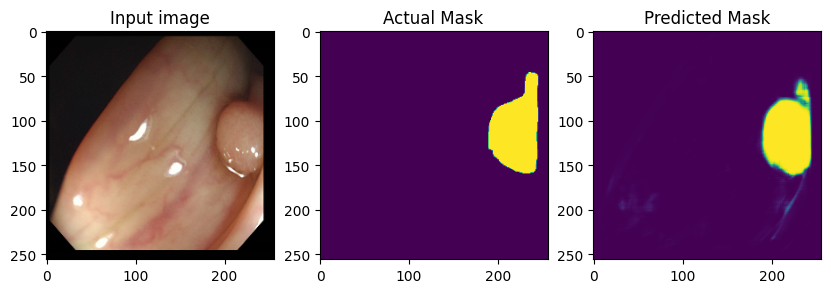

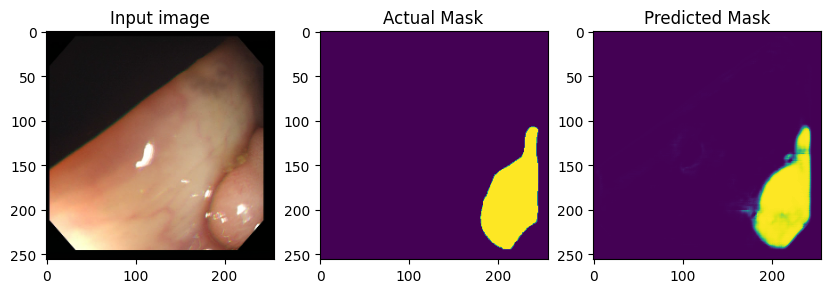

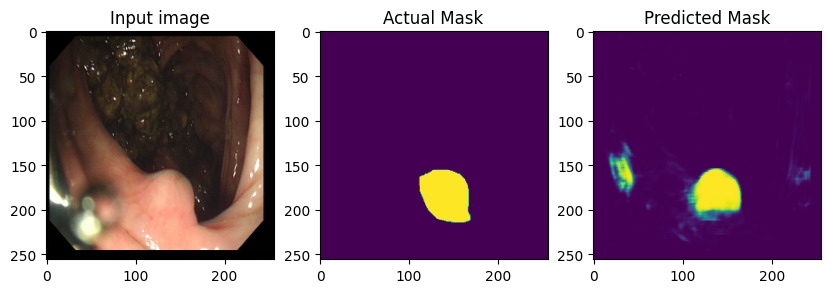

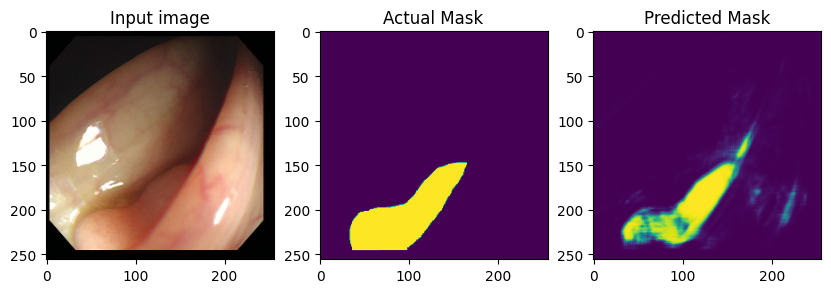

In [119]:
## Define print function
def print_images():
    import matplotlib.pyplot as plt

    # 5개의 이미지를 가져와서 출력
    for batch_index, (test_images, test_labels) in enumerate(test_dataset.take(5)):
        predictions = model(test_images, training=False)

        # 각 배치에서 하나의 이미지와 그에 해당하는 마스크 출력
        for i in range(test_images.shape[0]):
            plt.figure(figsize=(10, 5))

            plt.subplot(1, 3, 1)
            plt.imshow(test_images[i, :, :, :])
            plt.title("Input image")
            
            plt.subplot(1, 3, 2)
            plt.imshow(test_labels[i, :, :, 0])
            plt.title("Actual Mask")
            
            plt.subplot(1, 3, 3)
            plt.imshow(predictions[i, :, :, 0])
            plt.title("Predicted Mask")

            plt.show()

        # 5개의 배치만 처리 후 종료
        if batch_index == 4:
            break

print_images()

## 배치사이즈4 모델 비교

**encoder-decoder/ U-Net / Vgg16UNet 비교**

iou : 0.7916630810571875 / 0.8354637450693675 / 0.8496284703266106  
val_loss : 0.3064 / 0.2171 / 0.1885  
val_dice_loss: 0.2251 / 0.1651 / 0.1432  

  
전반적으로 엄청나게 큰 차이는 없었으나, encoder-decoder은 경계선도 흐릿하고 제대로 detect하지 못하는 비율이 조금 높고   
VGG16UNet이 제일 좋은 모습이었다. 

# 전체 비교

**encoder-decoder 8-4 / U-Net 8-4 / Vgg16UNet 8-4 비교**

iou : 0.8474698834511838-0.7916630810571875  / 0.8501262708667594 - 0.8354637450693675 / 0.8824816580942166 - 0.8496284703266106  
val_loss : 0.2425 - 0.3064 / 0.1789 - 0.2171 / 0.1293 - 0.1885   
val_dice_loss: 0.1863 - 0.2251 / 0.1348 - 0.1651 / 0.0959 - 0.1432  

  
확실히 배치사이즈가 큰 쪽이 더 성능이 좋았다.   
출력 이미지 상은 큰 변화는 없었던것 같다

encoder-decoder 8  
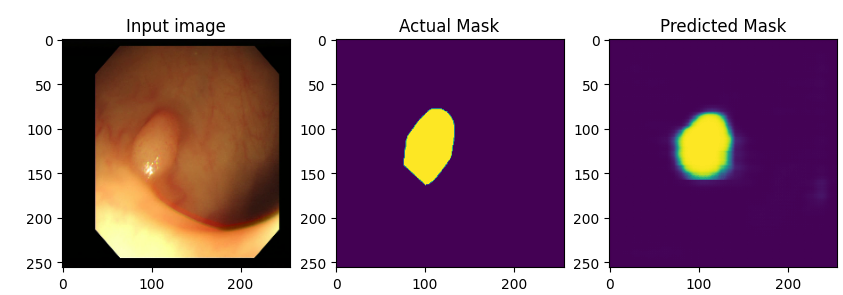   
encoder-decoder 4  
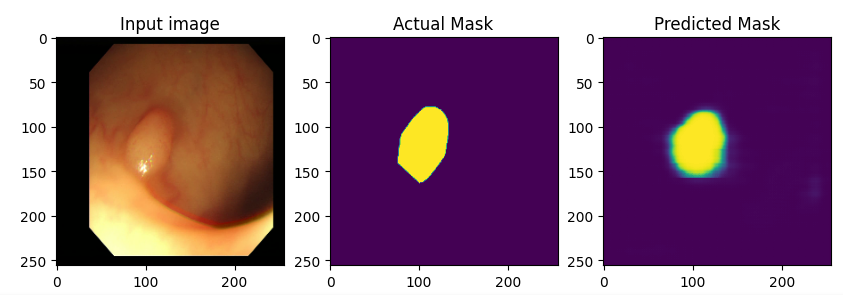

UNet 8  
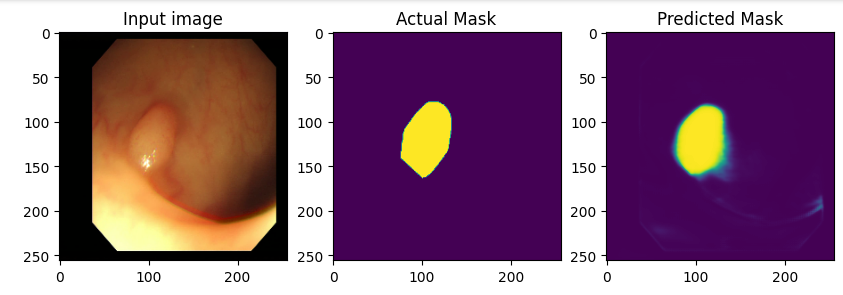  
UNet 4  
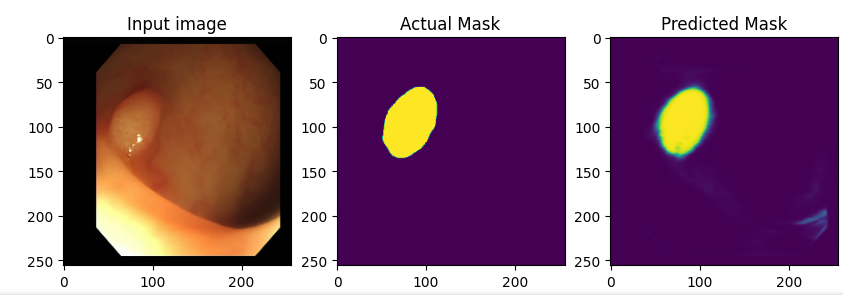

VGG16UNet 8  
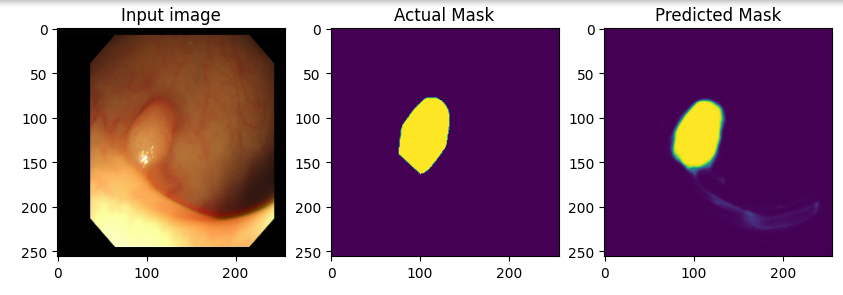  
Vgg16UNet 4  
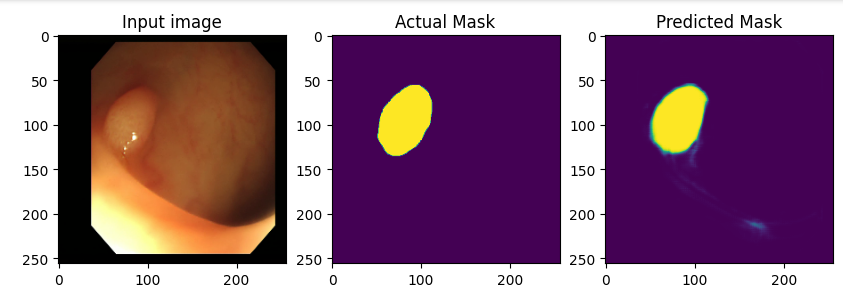

# 잘 안나온것들 경진대회  

encoder-decoder 8  
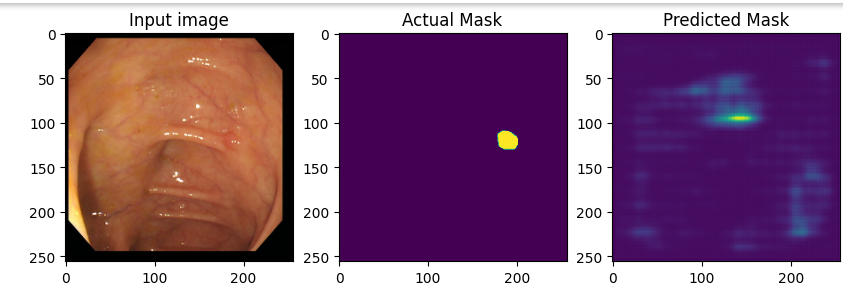  
encoder-decoder 4  
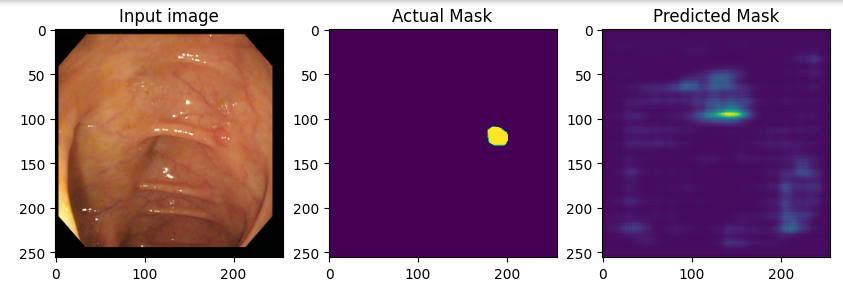

U-net 8  
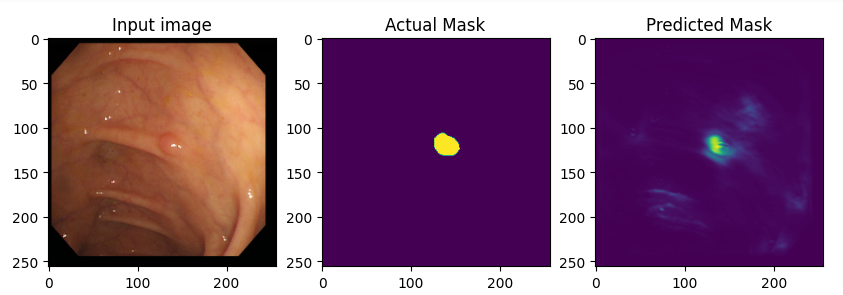  
U-net 4  
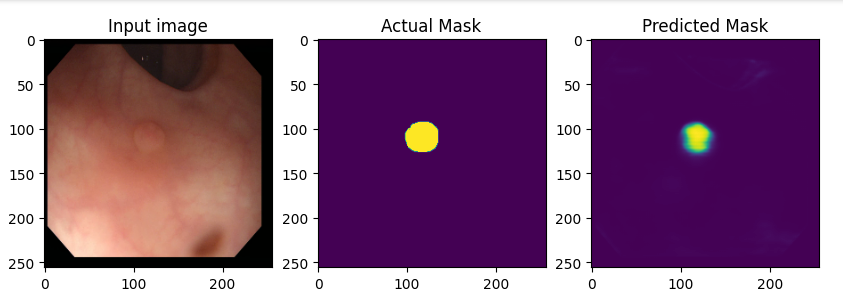

Vgg16UNet 8  
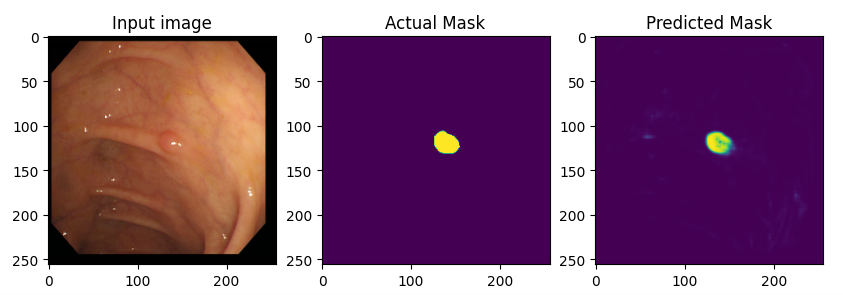
Vgg16UNet 4  
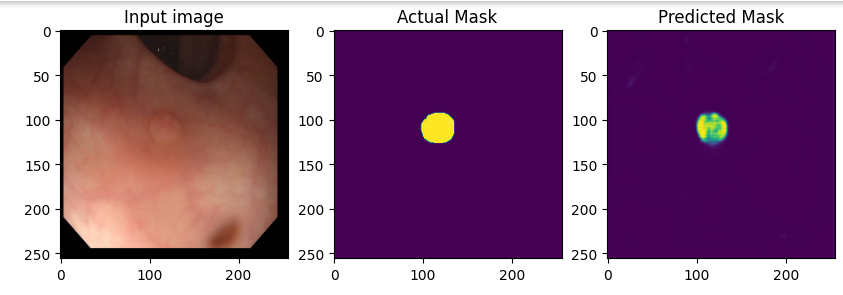  